<a href="https://colab.research.google.com/github/byhaqii/PVCK-2025/blob/main/Week4.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [3]:
import cv2 as cv
import numpy as np
from google.colab.patches import cv2_imshow

Mengubah tingkat kecerahan citra
--------------------------------


/tmp/ipython-input-3264714889.py:19: RuntimeWarning: overflow encountered in scalar add
  brightness_image[y,x,c] = np.clip(original[y,x,c] + brightness, 0, 255)


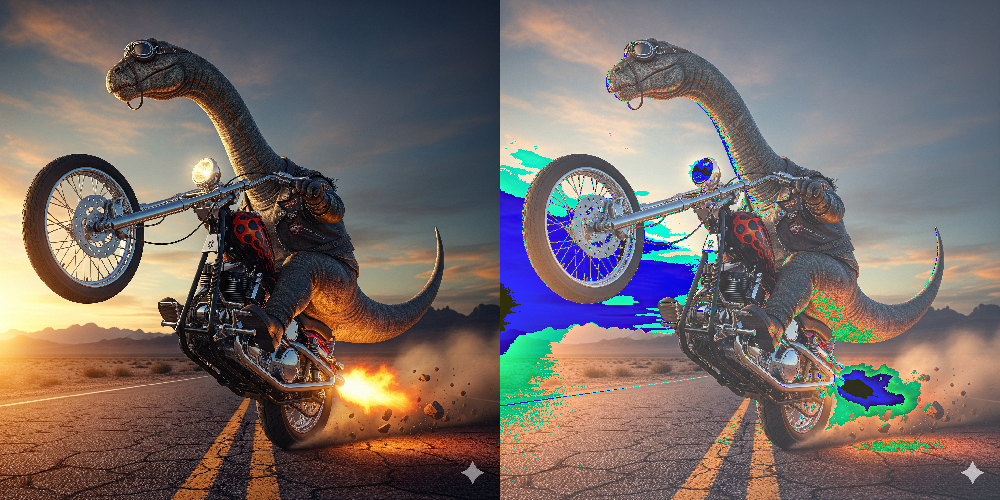

In [ ]:
import cv2 as cv
import numpy as np
from google.colab.patches import cv2_imshow

print('Mengubah tingkat kecerahan citra')
print('--------------------------------')
try:
  brightness = int(input('Masukkan nilai kecerahan: '))
except ValueError:
  print('Error, not a number')

original = cv.imread('/content/drive/MyDrive/images/dino.tiff')
brightness_image = np.zeros(original.shape, original.dtype)

#akses per piksel
for y in range(original.shape[0]):
  for x in range(original.shape[1]):
    for c in range(original.shape[2]):
      brightness_image[y,x,c] = np.clip(original[y,x,c] + brightness, 0, 255)

#cara simple tanpa loop
#brightness_image = cv.convertScaleAbs(original, beta=brightness)

final_frame = cv.hconcat((original, brightness_image))
cv2_imshow(final_frame)

## Praktikum D1

1. Implement image inversion on Google Collaboratory using the formulas found in the
Theory Review section, resulting in the following output:

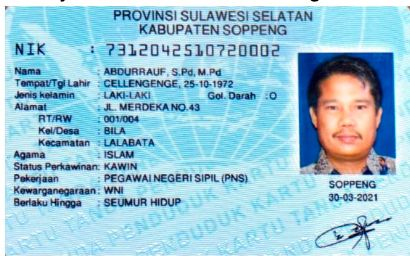

In [ ]:
imgktp = cv.imread('/content/drive/MyDrive/PVCK/Images/ktp.jpeg')

if imgktp is None:
    print("Error: Could not load image. Please check the file path.")
else:
    cv2_imshow(imgktp)

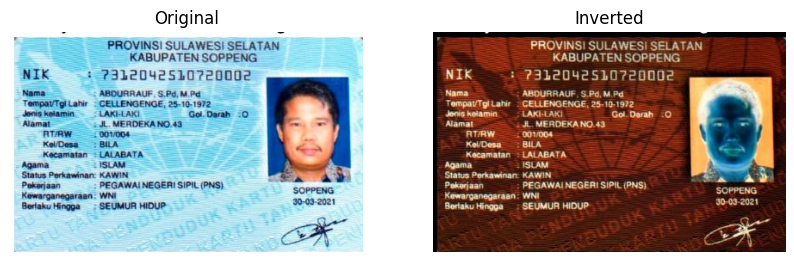

In [ ]:
import matplotlib.pyplot as plt
imgrgb = cv.cvtColor(imgktp, cv.COLOR_BGR2RGB)
inverted_img = 255 - imgrgb

# Tampilkan hasil
plt.figure(figsize=(10,5))

plt.subplot(1,2,1)
plt.imshow(imgrgb)
plt.title("Original")
plt.axis("off")

plt.subplot(1,2,2)
plt.imshow(inverted_img)
plt.title("Inverted")
plt.axis("off")

plt.show()

2. Implement the contrast transformation in Google Collaboratory using the formula found
in the Theory Review section for contrast, resulting in the following output:

This code first input brightnes than contrast same as question,but in modul contrast first then brightnes

 Mengubah kontras dan tingkat kecerahan citra 
----------------------------------
Masukkan tingkat kecerahan [-255 - 255]: 50
Masukkan nilai kontras [1.0 - 3.0]: 2


/tmp/ipython-input-799759058.py:20: RuntimeWarning: overflow encountered in scalar add
  temp = original[y,x,c] + beta


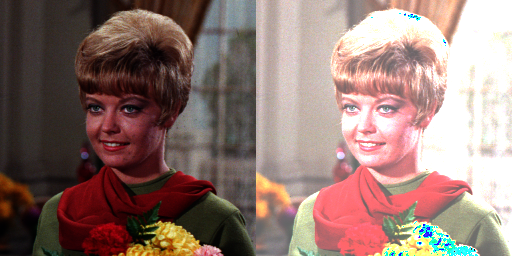

In [ ]:
import cv2 as cv
import numpy as np
from google.colab.patches import cv2_imshow

print(' Mengubah kontras dan tingkat kecerahan citra ')
print('----------------------------------')
try:
    beta = int(input('Masukkan tingkat kecerahan [-255 - 255]: '))
    alpha = float(input('Masukkan nilai kontras [1.0 - 3.0]: '))
except ValueError:
    print('Error, input tidak valid')

original = cv.imread('/content/drive/MyDrive/PVCK/Images/female.tiff')
result = np.zeros(original.shape, original.dtype)


for y in range(original.shape[0]):
    for x in range(original.shape[1]):
        for c in range(original.shape[2]):
            temp = original[y,x,c] + beta
            result[y,x,c] = np.clip(alpha * temp, 0, 255)

final_frame = cv.hconcat((original, result))
cv2_imshow(final_frame)

3. Implement the logarithmic brightness

*   List item
*   List item

transformation in Google Collaboratory using the
formula found in the Theory Review section for log transformation, resulting in the
following output:

 Logarithmic Brightness Transformation 
----------------------------------
Masukkan nilai konstanta kecerahan (contoh 20): 40


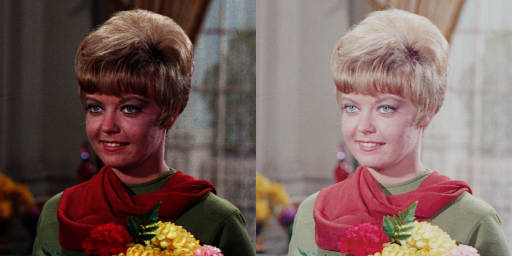

In [ ]:
print(" Logarithmic Brightness Transformation ")
print("----------------------------------")

try:
    c = float(input("Masukkan nilai konstanta kecerahan (contoh 20): "))
except ValueError:
    print("Error, input tidak valid")
    c = 1.0

# Baca gambar
original = cv.imread('/content/drive/MyDrive/PVCK/Images/female.tiff')

# Konversi ke float supaya log bisa jalan
log_img = (c * np.log(1 + original.astype(np.float32))).astype(np.uint8)

# Gabungkan hasil
final = cv.hconcat([original, log_img])
cv2_imshow(final)


4. Implement the grayscale transformation using the averaging, lightness, and luminance
methods on Google Collaboratory using the formulas found in the Theory Review
section, resulting in the following output:

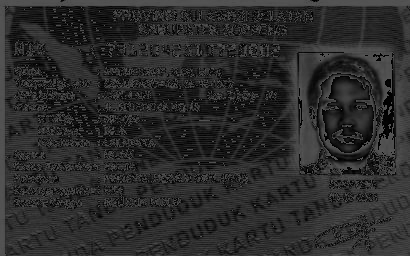

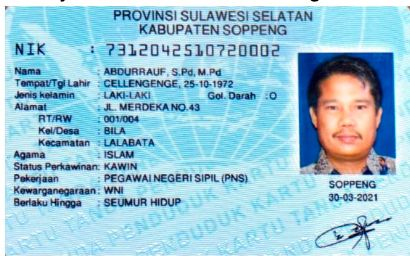

In [ ]:
imgktp1 = cv.imread('/content/drive/MyDrive/PVCK/Images/KTP.jpg')
R, G, B = cv.split(imgktp)


gray_avg = ((R + G + B)/3).astype(np.uint8)
gray3 = cv.cvtColor(gray_avg, cv.COLOR_GRAY2BGR)
cv2_imshow(gray3)
cv2_imshow(imgktp)

Image '/content/drive/MyDrive/PVCK/Images/ktp.jpeg' loaded successfully!


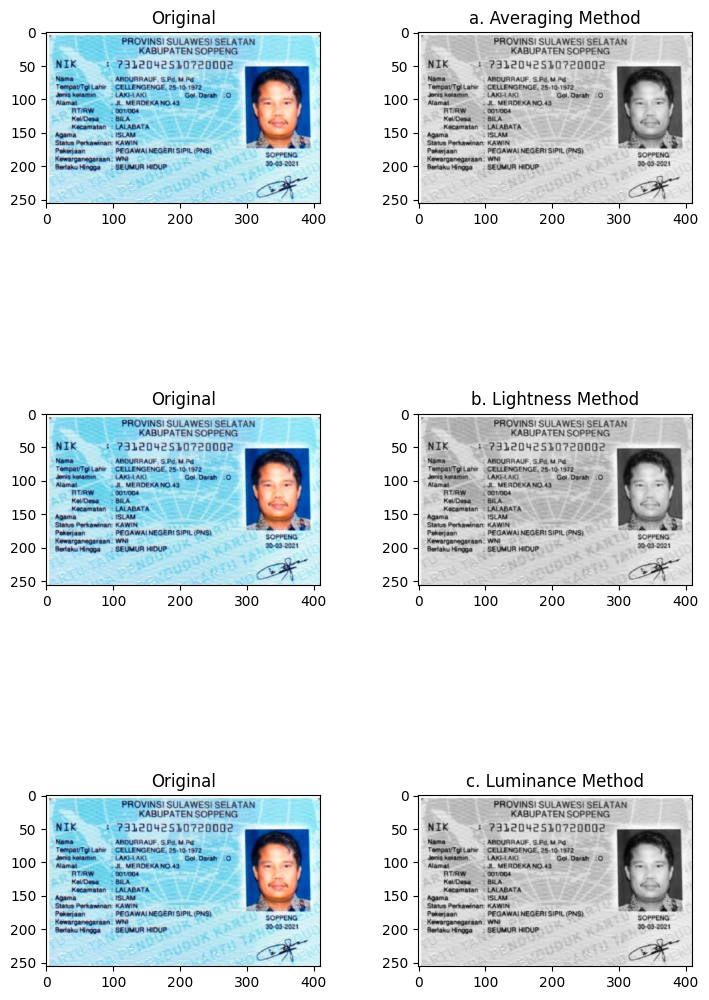

In [ ]:
import cv2 as cv
import numpy as np
import matplotlib.pyplot as plt

# Load the image
image_path = '/content/drive/MyDrive/PVCK/Images/KTP.jpg'
img = cv.imread(image_path)

# Check if image loaded successfully
if img is None:
    print(f"Error: Could not load image from path: {image_path}")
else:
    print(f"Image '{image_path}' loaded successfully!")

    # Convert BGR to RGB for matplotlib display
    imgrgb = cv.cvtColor(img, cv.COLOR_BGR2RGB)

    # Split channels
    B, G, R = cv.split(img)

    # 1. Averaging Method
    gray_avg = ((R + G + B) / 3).astype(np.uint8)

    # 2. Lightness Method
    gray_lightness = ((np.max(img, axis=2) + np.min(img, axis=2)) / 2).astype(np.uint8)

    # 3. Luminance Method (using standard coefficients)
    gray_luminance = (0.299 * R + 0.587 * G + 0.114 * B).astype(np.uint8)

    # Display results using matplotlib subplots
    plt.figure(figsize=(8, 12))

    # Original Image
    plt.subplot(3, 2, 1)
    plt.imshow(imgrgb)
    plt.title("Original")
    plt.axis("off")

    # Averaging Method
    plt.subplot(3, 2, 2)
    plt.imshow(gray_avg, cmap='gray')
    plt.title("a. Averaging Method")
    plt.axis("off")

    # Original Image (repeated for alignment)
    plt.subplot(3, 2, 3)
    plt.imshow(imgrgb)
    plt.title("Original")
    plt.axis("off")


    # Lightness Method
    plt.subplot(3, 2, 4)
    plt.imshow(gray_lightness, cmap='gray')
    plt.title("b. Lightness Method")
    plt.axis("off")

    # Original Image (repeated for alignment)
    plt.subplot(3, 2, 5)
    plt.imshow(imgrgb)
    plt.title("Original")
    plt.axis("off")

    # Luminance Method
    plt.subplot(3, 2, 6)
    plt.imshow(gray_luminance, cmap='gray')
    plt.title("c. Luminance Method")
    plt.axis("off")

    plt.tight_layout()
    plt.show()

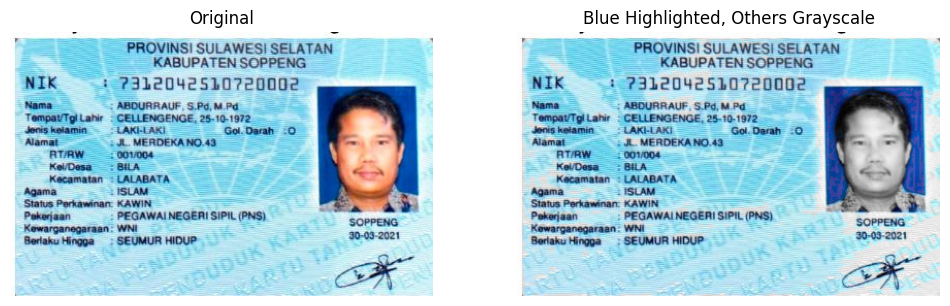

✅ Processed image saved at: /content/drive/MyDrive/PVCK/Images/blue_highlighted.png


In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# --- Step 1: Set your file path ---
image_path = '/content/drive/MyDrive/PVCK/Images/ktp.jpeg'

# --- Step 2: Read the image ---
image = cv2.imread(image_path)
image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

# --- Step 3: Convert to HSV for color filtering ---
hsv = cv2.cvtColor(image, cv2.COLOR_BGR2HSV)

# Define blue color range (tweak if needed)
lower_blue = np.array([90, 50, 50])
upper_blue = np.array([130, 255, 255])

# Mask for blue
mask = cv2.inRange(hsv, lower_blue, upper_blue)

# Extract blue parts
blue_parts = cv2.bitwise_and(image_rgb, image_rgb, mask=mask)

# --- Step 4: Convert whole image to grayscale ---
gray = cv2.cvtColor(image_rgb, cv2.COLOR_RGB2GRAY)
gray_3ch = cv2.cvtColor(gray, cv2.COLOR_GRAY2RGB)

# --- Step 5: Merge blue with grayscale ---
result = np.where(blue_parts != 0, image_rgb, gray_3ch)

# --- Step 6: Show results ---
fig, ax = plt.subplots(1, 2, figsize=(12, 6))
ax[0].imshow(image_rgb)
ax[0].set_title("Original")
ax[0].axis("off")

ax[1].imshow(result)
ax[1].set_title("Blue Highlighted, Others Grayscale")
ax[1].axis("off")

plt.show()

# --- Step 7: Save processed image ---
output_path = '/content/drive/MyDrive/PVCK/Images/blue_highlighted.png'
cv2.imwrite(output_path, cv2.cvtColor(result, cv2.COLOR_RGB2BGR))
print(f"✅ Processed image saved at: {output_path}")

# D2. Arithmetic and Logical Operations

=== GAMMA CORRECTION ===
Gamma Correction pada citra
----------------------------------
Masukkan nilai Gamma: 3


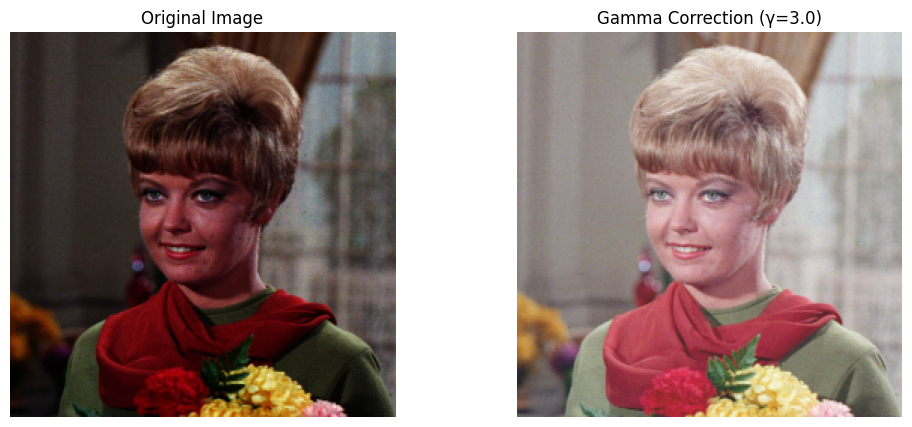

In [6]:
import cv2 as cv # Added import statement
import numpy as np
import matplotlib.pyplot as plt
from google.colab.patches import cv2_imshow # Although not used in this function, it was in the original cell

# TUGAS 1: GAMMA CORRECTION
def gamma_correction():
    print("=== GAMMA CORRECTION ===")
    print('Gamma Correction pada citra')
    print('----------------------------------')
    try:
        gamma = float(input('Masukkan nilai Gamma: '))
    except ValueError:
        print('Error, not a number')
        return

    # Load image (your path)
    original = cv.imread('/content/drive/MyDrive/PVCK/Images/female.tiff')
    gamma_img = np.zeros(original.shape, original.dtype)

    # Apply gamma correction
    for i in range(original.shape[0]):
        for j in range(original.shape[1]):
            for k in range(original.shape[2]):
                # Gamma correction formula: I' = 255 * (I/255)^(1/gamma)
                normalized = original[i, j, k] / 255.0
                corrected = 255 * (normalized ** (1.0 / gamma))
                gamma_img[i, j, k] = np.clip(int(corrected), 0, 255) # Added np.clip to ensure values are within 0-255 range

    # Display results
    plt.figure(figsize=(12, 5))
    plt.subplot(1, 2, 1)
    plt.imshow(cv.cvtColor(original, cv.COLOR_BGR2RGB))
    plt.title('Original Image')
    plt.axis('off')

    plt.subplot(1, 2, 2)
    plt.imshow(cv.cvtColor(gamma_img, cv.COLOR_BGR2RGB))
    plt.title(f'Gamma Correction (γ={gamma})')
    plt.axis('off')
    plt.show()

gamma_correction()

=== SIMULASI BIT DEPTH ===
Masukkan bit depth (1-7): 2


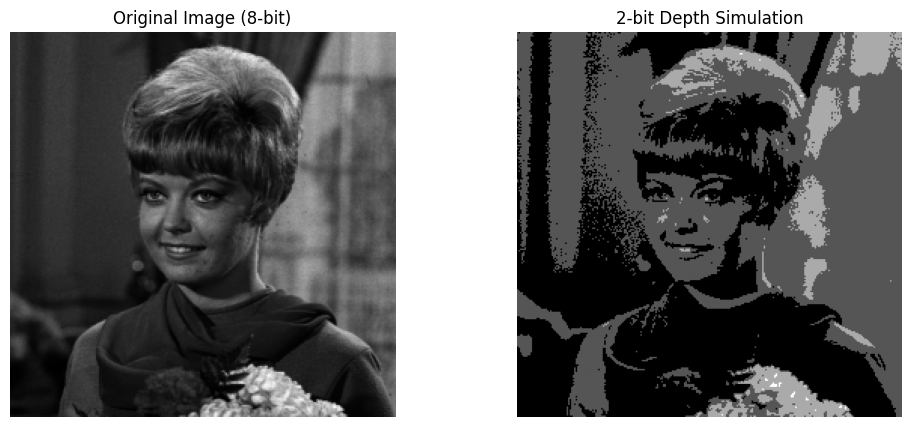

Bit depth: 2
Color levels: 4
Level value: 85.00


In [9]:
def bit_depth_simulation():
    print("=== SIMULASI BIT DEPTH ===")
    bit_depth = int(input('Masukkan bit depth (1-7): '))

    # Calculate level
    level = 255 / (pow(2, bit_depth) - 1)

    # Load image as grayscale (your path)
    original = cv.imread('/content/drive/MyDrive/PVCK/Images/female.tiff', cv.IMREAD_GRAYSCALE)
    if original is None:
        print("Error loading image: /content/drive/MyDrive/PVCK/Images/female.tiff")
        return
    depth_image = np.zeros(original.shape, original.dtype)

    # Apply bit depth reduction
    for i in range(original.shape[0]):
        for j in range(original.shape[1]):
            # Formula: C' = round((C/level) * level)
            depth_image[i, j] = int(round((original[i, j] / level)) * level)

    # Display results
    plt.figure(figsize=(12, 5))
    plt.subplot(1, 2, 1)
    plt.imshow(original, cmap='gray')
    plt.title('Original Image (8-bit)')
    plt.axis('off')

    plt.subplot(1, 2, 2)
    plt.imshow(depth_image, cmap='gray')
    plt.title(f'{bit_depth}-bit Depth Simulation')
    plt.axis('off')
    plt.show()

    print(f"Bit depth: {bit_depth}")
    print(f"Color levels: {pow(2, bit_depth)}")
    print(f"Level value: {level:.2f}")

# PSNR Function
from math import log10, sqrt
def PSNR(img1, img2):
    mse = np.mean((img1 - img2) ** 2)
    if mse == 0:  # MSE 0 means no noise, PSNR has no meaning
        return 100
    max_pixel = 255.0
    psnr = 20 * log10(max_pixel / sqrt(mse))
    return psnr

bit_depth_simulation()

Jumlah noisy images: 100
Images averaged: 10, PSNR: 27.56 dB
Images averaged: 20, PSNR: 27.53 dB
Images averaged: 40, PSNR: 27.45 dB
Images averaged: 80, PSNR: 27.40 dB
Images averaged: 100, PSNR: 27.37 dB


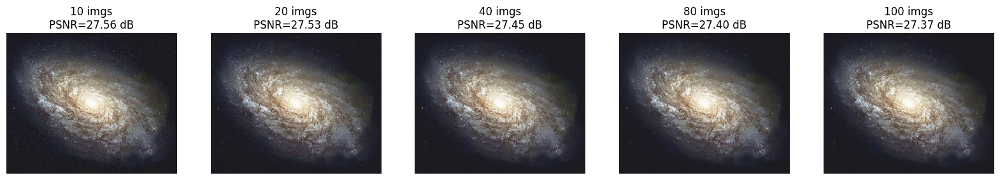

In [19]:
import cv2 as cv
import numpy as np
import matplotlib.pyplot as plt
import glob
from math import log10, sqrt

# --- Load original image (change if needed) ---
original = cv.imread('/content/drive/MyDrive/PVCK/Images/galaxy.jpg')
original = cv.cvtColor(original, cv.COLOR_BGR2RGB)

# --- Load noisy images ---
cv_img = []
for img in glob.glob('/content/drive/MyDrive/PVCK/Images/noises/*.jpg'):
    n = cv.imread(img)
    n = cv.cvtColor(n, cv.COLOR_BGR2RGB)
    cv_img.append(n)

print("Jumlah noisy images:", len(cv_img))

# --- PSNR function ---
def PSNR(img1, img2):
    mse = np.mean((img1 - img2) ** 2)
    if mse == 0:
        return 100
    max_pixel = 255.0
    return 20 * log10(max_pixel / sqrt(mse))

# --- Test with different number of averaged images ---
numbers = [10, 20, 40, 80, 100]
results = []
psnr_values = []

for num in numbers:
    avg_img = np.mean(cv_img[:num], axis=0).astype(np.uint8)
    psnr_value = PSNR(original, avg_img)
    results.append(avg_img)
    psnr_values.append(psnr_value)
    print(f"Images averaged: {num}, PSNR: {psnr_value:.2f} dB")

# --- Plot all results horizontally ---
fig, axes = plt.subplots(1, len(numbers), figsize=(20, 5))

for i, ax in enumerate(axes):
    ax.imshow(results[i])
    ax.set_title(f"{numbers[i]} imgs\nPSNR={psnr_values[i]:.2f} dB")
    ax.axis("off")

plt.show()

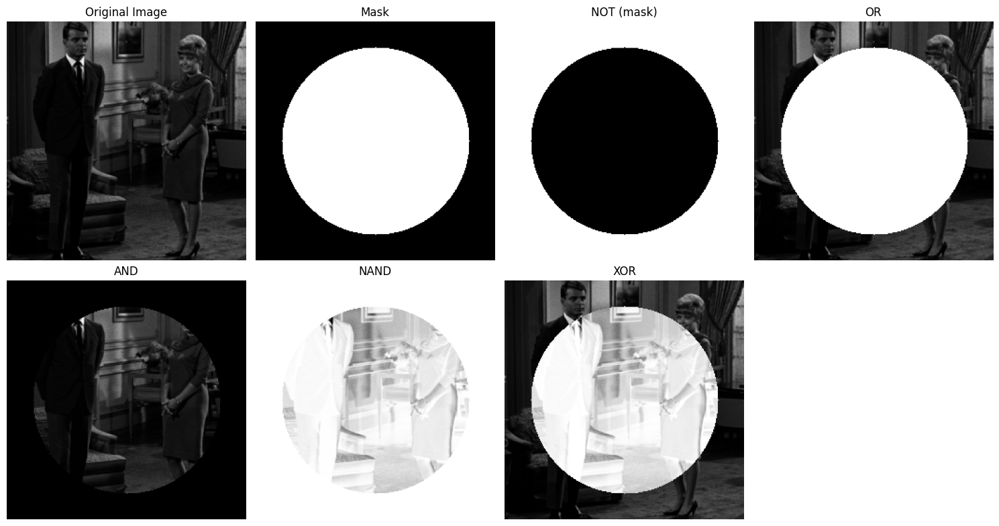

In [21]:
import cv2 as cv
import numpy as np
import matplotlib.pyplot as plt

# Load image (grayscale for masking operations)
img = cv.imread('/content/drive/MyDrive/PVCK/Images/couple.tiff', 0)

# Create a binary mask (circle shape as example)
mask = np.zeros_like(img, dtype=np.uint8)
cv.circle(mask, (img.shape[1]//2, img.shape[0]//2), 100, 255, -1)  # circle mask

# Apply logical operations
not_mask = cv.bitwise_not(mask)                # NOT
or_result = cv.bitwise_or(img, mask)           # OR
and_result = cv.bitwise_and(img, mask)         # AND
nand_result = cv.bitwise_not(and_result)       # NAND
xor_result = cv.bitwise_xor(img, mask)         # XOR

# Show results
titles = ["Original Image", "Mask",
          "NOT (mask)", "OR", "AND", "NAND", "XOR"]
images = [img, mask, not_mask, or_result, and_result, nand_result, xor_result]

plt.figure(figsize=(15, 8))
for i in range(len(images)):
    plt.subplot(2, 4, i+1)
    plt.imshow(images[i], cmap='gray')
    plt.title(titles[i])
    plt.axis('off')
plt.tight_layout()
plt.show()